#  Cats and Dogs, Better
Applied Neural Networks <br/>


Use the Cats and Dogs dataset in Kaggle from Homework 3. .

In [1]:
#importing libraries

import tensorflow as tf
from tensorflow import keras


In [2]:
#force installing latest version
!pip install --upgrade --force-reinstall --no-deps kaggle

  Using cached kaggle-1.5.12-py3-none-any.whl
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.12
    Uninstalling kaggle-1.5.12:
      Successfully uninstalled kaggle-1.5.12


In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle (5).json


{'kaggle.json': b'{"username":"nirajanbhattarai1","key":"393475f2087365708c471ee5dbac5344"}'}

In [4]:
#making directory 
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [5]:
#copying token file into the directory 
!cp kaggle.json ~/.kaggle/

In [6]:
# Authentication
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
#Downloading Cat and Dog dataset
!kaggle competitions download -c dogs-vs-cats-redux-kernels-edition

dogs-vs-cats-redux-kernels-edition.zip: Skipping, found more recently modified local copy (use --force to force download)


In [8]:
!unzip dogs-vs-cats-redux-kernels-edition.zip

Archive:  dogs-vs-cats-redux-kernels-edition.zip
replace sample_submission.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: All
  inflating: sample_submission.csv   
  inflating: test.zip                
  inflating: train.zip               


In [9]:
!unzip train.zip
#https://www.youtube.com/watch?v=57N1g8k2Hwc

Streaming output truncated to the last 5000 lines.
  inflating: train/dog.5499.jpg      
  inflating: train/dog.55.jpg        
  inflating: train/dog.550.jpg       
  inflating: train/dog.5500.jpg      
  inflating: train/dog.5501.jpg      
  inflating: train/dog.5502.jpg      
  inflating: train/dog.5503.jpg      
  inflating: train/dog.5504.jpg      
  inflating: train/dog.5505.jpg      
  inflating: train/dog.5506.jpg      
  inflating: train/dog.5507.jpg      
  inflating: train/dog.5508.jpg      
  inflating: train/dog.5509.jpg      
  inflating: train/dog.551.jpg       
  inflating: train/dog.5510.jpg      
  inflating: train/dog.5511.jpg      
  inflating: train/dog.5512.jpg      
  inflating: train/dog.5513.jpg      
  inflating: train/dog.5514.jpg      
  inflating: train/dog.5515.jpg      
  inflating: train/dog.5516.jpg      
  inflating: train/dog.5517.jpg      
  inflating: train/dog.5518.jpg      
  inflating: train/dog.5519.jpg      
  inflating: train/dog.552.jpg       

In [10]:
#load it into one dataframe and create your y labels
import os
import pandas as pd

filenames = os.listdir("/content/train")
categories = []
for filename in filenames:
    category = filename.split('.')[0]
    if category == 'cat':
        categories.append(1)
    else:
        categories.append(0)

df = pd.DataFrame({
    'filename': filenames,
    'category': categories
})
# code provided by Dr. Leslie Kerby

In [16]:
!train/

/bin/bash: train/: Is a directory


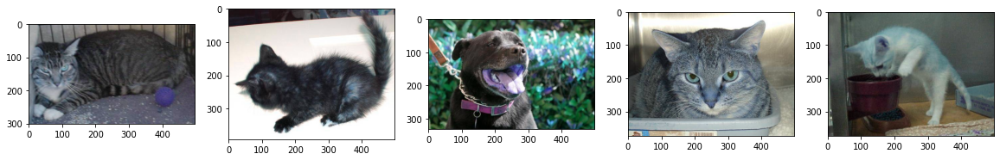

In [11]:
import cv2
import matplotlib.pyplot as plt
plt.figure(figsize=(20,8))
for index in range(5):
  plt.subplot(1,5,index+1)
  img = cv2.imread('train/'+df['filename'][index], cv2.IMREAD_COLOR)
  plt.imshow(img)
plt.show()

In [12]:
# Getting  feature set from image file
import cv2
import numpy as np

def resize_img(file_path):
  img = cv2.imread(file_path, cv2.IMREAD_COLOR)
  return cv2.resize(img, (50,50)) 
X = np.ndarray((25000,50,50,3))  
for i,image_file in enumerate(df['filename']):
    X[i,:] = resize_img('train/'+image_file)


In [13]:
y=df['category']

In [14]:
y=np.array(y)
X=np.array(X)

In [15]:
X.shape

(25000, 50, 50, 3)

In [16]:
#Getting Validation set
from sklearn.model_selection import train_test_split

from sklearn.model_selection import train_test_split
X_train_full, X_train_v, y_train_full, y_train_v = train_test_split(X,
                                                                y,
                                                                test_size=5000)
#Splitting training dataset into ultimate training and testing set
X_train_tr, X_test, y_train_tr, y_test= train_test_split(X_train_full,
                                                                y_train_full,
                                                                test_size=5000)

**Part 1** <br/>
Create a CNN dog/cat classifier with the following architecture: <br/>
Conv2D: 64 filters, 7x7 kernel <br/>
MaxPooling2D: 2x2 pool <br/>
Conv2D: 128 filters, 3x3 kernel <br/>
Conv2D: 128 filters, 3x3 kernel <br/>
MaxPooling2D: 2x2 pool <br/>
Conv2D: 256 filters, 3x3 kernel <br/>
Conv2D: 256 filters, 3x3 kernel <br/>
MaxPooling2D: 2x2 pool <br/>
Flatten <br/>
Dense: 128 neurons <br/>
Dropout(15%) <br/>
Dense: 64 neurons <br/>
Dropout(15%) <br/>
Output <br/>
strides=1, padding="same", and activation="relu" for all relevant layers <br/>
Utilize the Nadam optimizer and Early Stopping

What is your accuracy for the validation set and for the test set? Plot several misclassified images.

Save your accuracy and val_accuracy each epoch. You will plot them in Part 4.

In [19]:
#Simple CNN without Normalization
model = keras.models.Sequential([
        keras.layers.Conv2D(filters=64, kernel_size=[7,7], strides=[1,1],
                            padding="same", activation="relu", input_shape=[50,50,3]),
        keras.layers.MaxPool2D(pool_size=2),
        keras.layers.Conv2D(filters=128, kernel_size=3, strides=1, padding="same",
                            activation="relu"),
        keras.layers.Conv2D(filters=128, kernel_size=3, strides=1, padding="same",
                            activation="relu"),
        keras.layers.MaxPool2D(2),
        keras.layers.Conv2D(256, 3), # padding="valid", no activation, strides=1, are defaults
        keras.layers.Conv2D(256, 3),
        keras.layers.MaxPool2D(2),
        keras.layers.Flatten(),
        keras.layers.Dense(128, activation="relu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(64, activation="relu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(10, activation="softmax")
])


In [20]:
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam",
              metrics=["accuracy"])

In [21]:

history1 = model.fit(X_train_tr, y_train_tr, epochs=100, batch_size=32,
                    validation_data=(X_train_v, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/100
469/469 [==============================] - 31s 41ms/step - loss: 1.4599 - accuracy: 0.5041 - val_loss: 0.6952 - val_accuracy: 0.5100
Epoch 2/100
469/469 [==============================] - 18s 39ms/step - loss: 0.7322 - accuracy: 0.4987 - val_loss: 0.7011 - val_accuracy: 0.4916
Epoch 3/100
469/469 [==============================] - 19s 39ms/step - loss: 0.7167 - accuracy: 0.5016 - val_loss: 0.6941 - val_accuracy: 0.5080
Epoch 4/100
469/469 [==============================] - 19s 40ms/step - loss: 0.7003 - accuracy: 0.5063 - val_loss: 0.6934 - val_accuracy: 0.5084
Epoch 5/100
469/469 [==============================] - 18s 39ms/step - loss: 0.6986 - accuracy: 0.5043 - val_loss: 0.6947 - val_accuracy: 0.4916
Epoch 6/100
469/469 [==============================] - 18s 39ms/step - loss: 0.6989 - accuracy: 0.4979 - val_loss: 0.6941 - val_accuracy: 0.5084
Epoch 7/100
469/469 [==============================] - 18s 39ms/step - loss: 0.6973 - accuracy: 0.5011 - val_loss: 0.6930 - val_ac

In [22]:
model.evaluate(X_test, y_test)

157/157 [==============================] - 2s 14ms/step - loss: 0.6942 - accuracy: 0.5068


[0.694240927696228, 0.5067999958992004]

In [73]:
print('The maximun train accuracy and validation accuracy is' , max(history1.history['val_accuracy']) )

The maximun train accuracy and validation accuracy is 0.5099999904632568


#

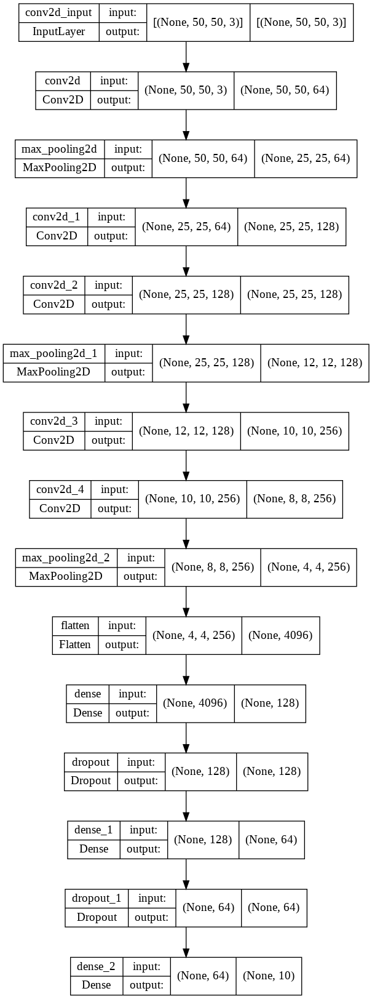

In [23]:
keras.utils.plot_model(model, show_shapes=True)

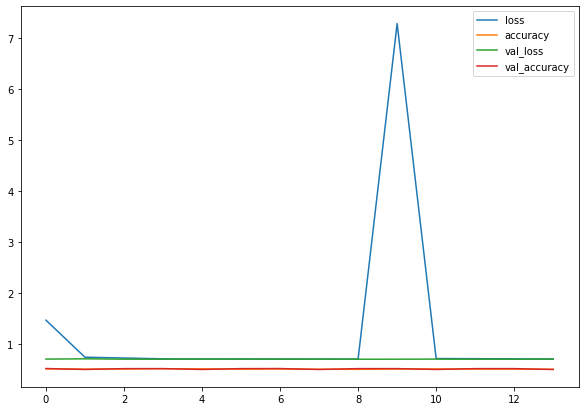

In [24]:
pd.DataFrame(history1.history).plot(figsize=(10,7))

In [25]:
X_test.shape

(5000, 50, 50, 3)

(50, 50, 3)
(50, 50, 3)
(50, 50, 3)
(50, 50, 3)
(50, 50, 3)


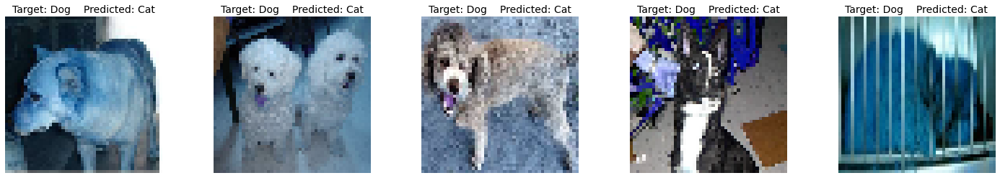

In [26]:
#Ploting several of the misclassified images from the model


classes = ['Dog', 'Cat']

predictions = np.argmax(model.predict(X_test), axis=-1)
misclassifiedIndexes = []
index = 0
for target, predict in zip(y_test, predictions):
  if target != predict:
    misclassifiedIndexes.append(index)
  index += 1

misclassifiedIndexes

plt.figure(figsize=(25,4))
for index in range(5):
  plt.subplot(1,5,index+1)
  img=X_test[misclassifiedIndexes[index]]/255
  print(img.shape)
  plt.imshow(img, cmap='binary')
  plt.axis('off')
  plt.title(f'Target: {classes[y_test[misclassifiedIndexes[index]]]}    Predicted: {classes[predictions[misclassifiedIndexes[index]]]}', fontsize=14)

In [27]:
model.save('simple_CNN')

INFO:tensorflow:Assets written to: simple_CNN/assets


In [28]:
model.save_weights('simple_CNN_weights')

In [29]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

#  Accuracy for the validation set and for the test set are 0.5099999904632568 and 0.5067999958992004 respectively.

**Part 2** </br>
Add data augmentation. Try different CNN architectures and/or parameters to improve your model. You may also try splitting up the dataset differently (ie more images in training and less in validation and testing sets).

What is the accuracy of your best model (on both validation and testing sets)? Plot several misclassified images. Save your accuracy and val_accuracy per epoch (from your best model). You will plot them in Part 4.

In [15]:
# With data augmentation Model 2
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(rotation_range=15,
                                rescale=1./255,
                                shear_range=0.1,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                width_shift_range=0.1,
                                height_shift_range=0.1
                                )


In [31]:
# Simple CNN for models with data augmentation
model = keras.models.Sequential([
        keras.layers.Conv2D(filters=64, kernel_size=[7,7], strides=[1,1],
                            padding="same", activation="relu", input_shape=[50,50,3]),
        keras.layers.MaxPool2D(pool_size=2),
        keras.layers.Conv2D(filters=128, kernel_size=3, strides=1, padding="same",
                            activation="relu"),
        keras.layers.Conv2D(filters=128, kernel_size=3, strides=1, padding="same",
                            activation="relu"),
        keras.layers.MaxPool2D(2),
        keras.layers.Conv2D(256, 3, padding="same"),
        keras.layers.Conv2D(256, 3, padding="same"),
        keras.layers.MaxPool2D(2),
        keras.layers.Flatten(),
        keras.layers.Dense(128, activation="relu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(64, activation="relu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(32, activation="relu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(16, activation="relu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(10, activation="softmax")
        ])

In [32]:
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam",
              metrics=["accuracy"])

In [33]:
history2 = model.fit(datagen.flow(X_train_tr, y_train_tr, batch_size=32),
                    epochs=100,
                    validation_data=(X_train_v, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/100
469/469 [==============================] - 30s 57ms/step - loss: 0.8539 - accuracy: 0.4972 - val_loss: 0.9475 - val_accuracy: 0.4916
Epoch 2/100
469/469 [==============================] - 26s 56ms/step - loss: 1.6769 - accuracy: 0.4967 - val_loss: 2.3469 - val_accuracy: 0.5084
Epoch 3/100
469/469 [==============================] - 26s 56ms/step - loss: 0.7185 - accuracy: 0.4933 - val_loss: 1.3049 - val_accuracy: 0.5078
Epoch 4/100
469/469 [==============================] - 27s 57ms/step - loss: 0.7075 - accuracy: 0.4991 - val_loss: 1.8615 - val_accuracy: 0.4896
Epoch 5/100
469/469 [==============================] - 26s 56ms/step - loss: 0.7029 - accuracy: 0.5080 - val_loss: 1.7990 - val_accuracy: 0.5072
Epoch 6/100
469/469 [==============================] - 26s 56ms/step - loss: 0.7015 - accuracy: 0.5019 - val_loss: 1.2289 - val_accuracy: 0.4724


In [34]:
model.evaluate(X_test, y_test)

157/157 [==============================] - 2s 14ms/step - loss: 1.2247 - accuracy: 0.4656


[1.224740982055664, 0.46560001373291016]

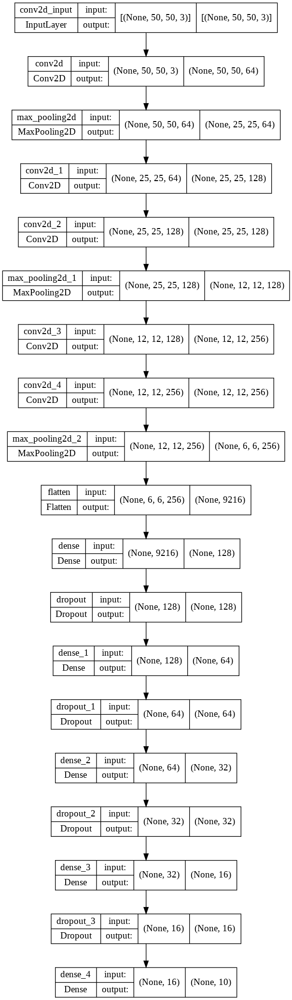

In [35]:
keras.utils.plot_model(model, show_shapes=True)

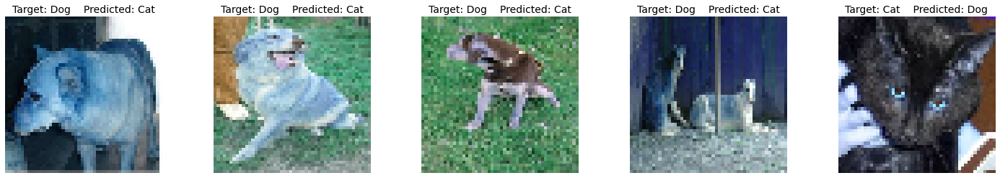

In [36]:
#Ploting several of the misclassified images from the model


classes = ['Dog', 'Cat']

predictions = np.argmax(model.predict(X_test), axis=-1)
misclassifiedIndexes = []
index = 0
for target, predict in zip(y_test, predictions):
  if target != predict:
    misclassifiedIndexes.append(index)
  index += 1

misclassifiedIndexes

plt.figure(figsize=(25,4))
for index in range(5):
  plt.subplot(1,5,index+1)
  plt.imshow(X_test[misclassifiedIndexes[index]]/255, cmap='binary')
  plt.axis('off')
  plt.title(f'Target: {classes[y_test[misclassifiedIndexes[index]]]}    Predicted: {classes[predictions[misclassifiedIndexes[index]]]}', fontsize=14)

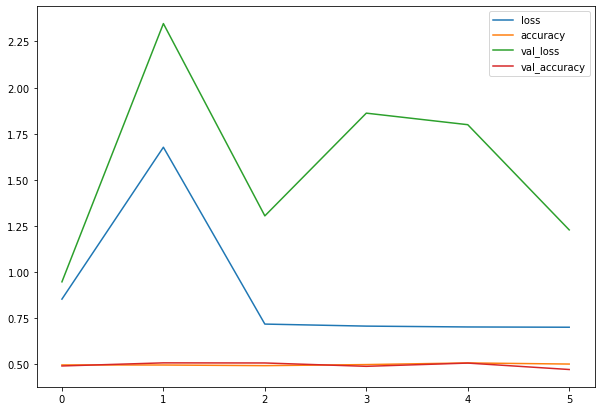

In [37]:
pd.DataFrame(history2.history).plot(figsize=(10,7))

In [38]:
model.save("Model_with_dataAugmentation")

INFO:tensorflow:Assets written to: Model_with_dataAugmentation/assets


In [39]:
model.save_weights("Model_with_dataAugmentation")

In [40]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [41]:
# With batch Normlaizatin Model 3
model = keras.models.Sequential([
        keras.layers.BatchNormalization(input_shape=[50,50,3]), 
        keras.layers.Conv2D(filters=64, kernel_size=[7,7], strides=[1,1],
                            padding="same", activation="relu"),
        keras.layers.MaxPool2D(pool_size=2),
        keras.layers.Conv2D(filters=128, kernel_size=3, strides=1, padding="same",
                            activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Conv2D(filters=128, kernel_size=3, strides=1, padding="same",
                            activation="relu"),
        keras.layers.MaxPool2D(2),
        keras.layers.Conv2D(256, 3, padding="same"),
        keras.layers.BatchNormalization(),
        keras.layers.Conv2D(256, 3, padding="same"),
        keras.layers.MaxPool2D(2),
        keras.layers.Flatten(),
        keras.layers.Dense(128, activation="relu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(64, activation="relu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(10, activation="softmax")])

model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam",
              metrics=["accuracy"])


history3 = model.fit(X_train_tr, y_train_tr, batch_size=32,
                    epochs=100,
                    validation_data=(X_train_v, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/100
469/469 [==============================] - 25s 48ms/step - loss: 0.8895 - accuracy: 0.5366 - val_loss: 0.6685 - val_accuracy: 0.6180
Epoch 2/100
469/469 [==============================] - 23s 49ms/step - loss: 0.6896 - accuracy: 0.5996 - val_loss: 0.6319 - val_accuracy: 0.6608
Epoch 3/100
469/469 [==============================] - 22s 47ms/step - loss: 0.6002 - accuracy: 0.6808 - val_loss: 0.5482 - val_accuracy: 0.7238
Epoch 4/100
469/469 [==============================] - 22s 47ms/step - loss: 0.5378 - accuracy: 0.7367 - val_loss: 0.7652 - val_accuracy: 0.6194
Epoch 5/100
469/469 [==============================] - 22s 47ms/step - loss: 0.4851 - accuracy: 0.7733 - val_loss: 0.5782 - val_accuracy: 0.7386
Epoch 6/100
469/469 [==============================] - 22s 47ms/step - loss: 0.4512 - accuracy: 0.7898 - val_loss: 0.4574 - val_accuracy: 0.7896
Epoch 7/100
469/469 [==============================] - 22s 47ms/step - loss: 0.4131 - accuracy: 0.8107 - val_loss: 0.4373 - val_ac

In [42]:
model.evaluate(X_test, y_test)

157/157 [==============================] - 2s 13ms/step - loss: 0.4651 - accuracy: 0.8356


[0.4651307165622711, 0.8356000185012817]

In [74]:
print('The maximun  validation accuracy for best fit model is' , max(history3.history['val_accuracy']) )

The maximun  validation accuracy for best fit model is 0.8468000292778015


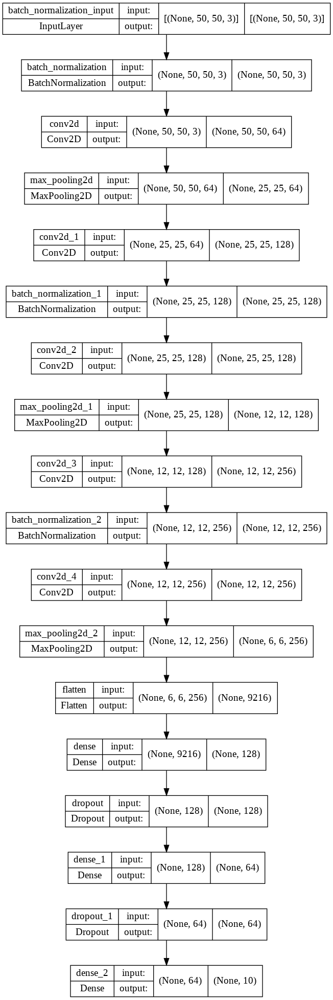

In [43]:
keras.utils.plot_model(model, show_shapes=True)

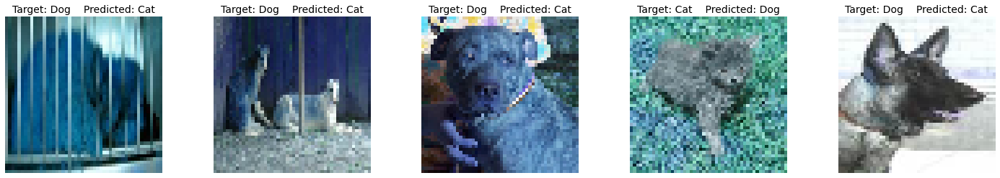

In [44]:
#Ploting several of the misclassified images from the model


classes = ['Dog', 'Cat']

predictions = np.argmax(model.predict(X_test), axis=-1)
misclassifiedIndexes = []
index = 0
for target, predict in zip(y_test, predictions):
  if target != predict:
    misclassifiedIndexes.append(index)
  index += 1

misclassifiedIndexes

plt.figure(figsize=(25,4))
for index in range(5):
  plt.subplot(1,5,index+1)
  plt.imshow(X_test[misclassifiedIndexes[index]]/255, cmap='binary')
  plt.axis('off')
  plt.title(f'Target: {classes[y_test[misclassifiedIndexes[index]]]}    Predicted: {classes[predictions[misclassifiedIndexes[index]]]}', fontsize=14)

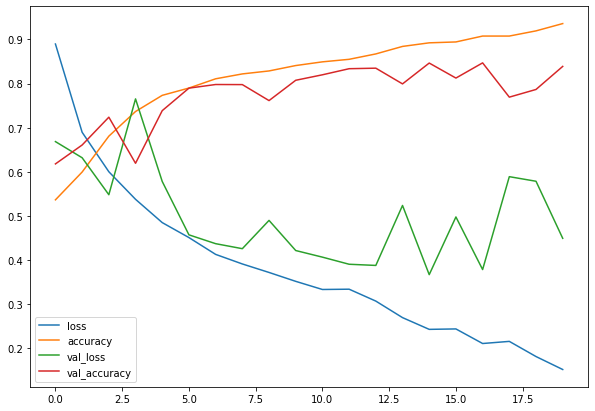

In [45]:
pd.DataFrame(history3.history).plot(figsize=(10,7))

In [46]:
model.save('With_batchNormalization')

INFO:tensorflow:Assets written to: With_batchNormalization/assets


In [47]:
model.save_weights('With_batchNormalization_weights')

In [48]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [49]:
#Trying out different split size  Aproach 2
from sklearn.model_selection import train_test_split

from sklearn.model_selection import train_test_split
X_train_full, X_train_v, y_train_full, y_train_v = train_test_split(X,
                                                                y,
                                                                test_size=1000)
#Splitting training dataset into ultimate training and testing set
X_train_tr, X_test, y_train_tr, y_test= train_test_split(X_train_full,
                                                                y_train_full,
                                                                test_size=1000)



In [50]:
# Build CNN (without normalization) Aproach 2
model = keras.models.Sequential([
        keras.layers.Conv2D(filters=128, kernel_size=[10,10], strides=[1,1],
                            padding="same", activation="selu", input_shape=[50,50,3]),
        keras.layers.MaxPool2D(pool_size=2),
        keras.layers.Conv2D(filters=256, kernel_size=3, strides=1, padding="same",
                            activation="selu"),
        keras.layers.Conv2D(filters=256, kernel_size=3, strides=1, padding="same",
                            activation="selu"),
        keras.layers.MaxPool2D(2),
        keras.layers.Conv2D(512, 3, padding="same"),
        keras.layers.Conv2D(512, 3, padding="same"),
        keras.layers.MaxPool2D(2),
        keras.layers.Flatten(),
        keras.layers.Dense(256, activation="selu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(128, activation="selu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(10, activation="softmax")
        ])
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam",
              metrics=["accuracy"])

history4 = model.fit(datagen.flow(X_train_tr, y_train_tr, batch_size=32),
                    epochs=100,
                    validation_data=(X_train_v, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/100
719/719 [==============================] - 68s 90ms/step - loss: 277.2384 - accuracy: 0.4977 - val_loss: 11415.5840 - val_accuracy: 0.5200
Epoch 2/100
719/719 [==============================] - 64s 89ms/step - loss: 2.0852 - accuracy: 0.5039 - val_loss: 22711.4180 - val_accuracy: 0.4800
Epoch 3/100
719/719 [==============================] - 64s 89ms/step - loss: 0.9739 - accuracy: 0.5053 - val_loss: 22479.6973 - val_accuracy: 0.4800
Epoch 4/100
719/719 [==============================] - 70s 98ms/step - loss: 0.9192 - accuracy: 0.5036 - val_loss: 18646.5625 - val_accuracy: 0.4800
Epoch 5/100
719/719 [==============================] - 66s 92ms/step - loss: 0.9037 - accuracy: 0.5055 - val_loss: 19615.5488 - val_accuracy: 0.4800
Epoch 6/100
719/719 [==============================] - 69s 96ms/step - loss: 0.9034 - accuracy: 0.4993 - val_loss: 18421.2793 - val_accuracy: 0.4800


In [52]:
model.evaluate(X_test, y_test)

32/32 [==============================] - 1s 31ms/step - loss: 17482.8320 - accuracy: 0.5080


[17482.83203125, 0.5080000162124634]

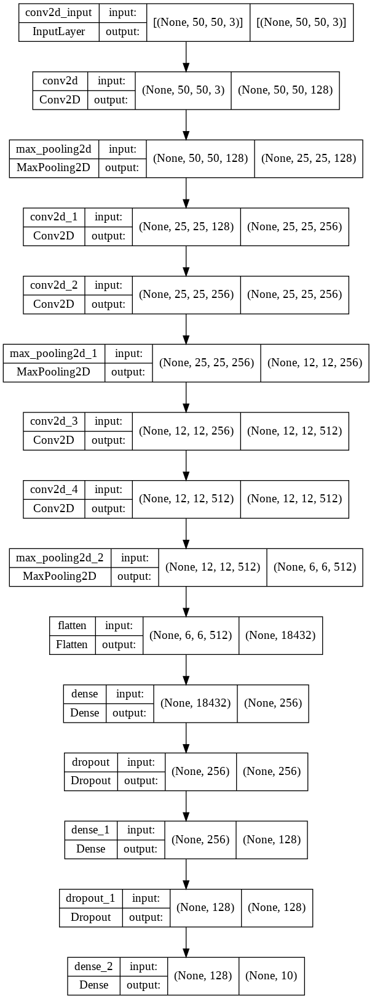

In [53]:
keras.utils.plot_model(model, show_shapes=True)

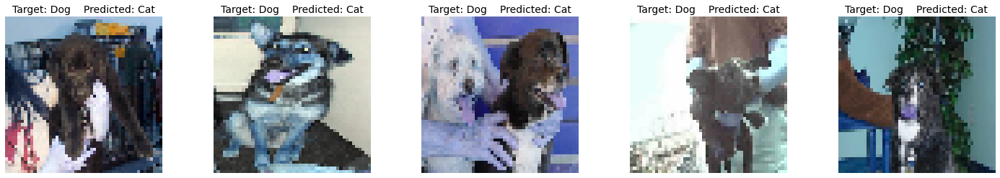

In [54]:
#Ploting several of the misclassified images from the model


classes = ['Dog', 'Cat']

predictions = np.argmax(model.predict(X_test), axis=-1)
misclassifiedIndexes = []
index = 0
for target, predict in zip(y_test, predictions):
  if target != predict:
    misclassifiedIndexes.append(index)
  index += 1

misclassifiedIndexes

plt.figure(figsize=(25,4))
for index in range(5):
  plt.subplot(1,5,index+1)
  plt.imshow(X_test[misclassifiedIndexes[index]]/255, cmap='binary')
  plt.axis('off')
  plt.title(f'Target: {classes[y_test[misclassifiedIndexes[index]]]}    Predicted: {classes[predictions[misclassifiedIndexes[index]]]}', fontsize=14)

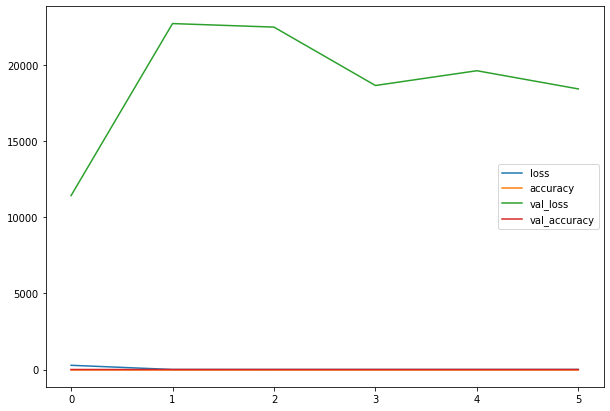

In [55]:
pd.DataFrame(history4.history).plot(figsize=(10,7))

In [56]:
model.save("Diff_split_withoutBatchNormalization")

INFO:tensorflow:Assets written to: Diff_split_withoutBatchNormalization/assets


In [57]:
model.save_weights("Diff_split_withoutBatchNormalization_weight")

In [58]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [17]:
# with data augmentation for appraoch 2
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(rotation_range=15,
                                rescale=1./255,
                                shear_range=0.1,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                width_shift_range=0.1,
                                height_shift_range=0.1
                                )

In [60]:
# Approach2 with batch normalization
model = keras.models.Sequential([
        keras.layers.BatchNormalization(input_shape=[50,50,3]), # doesn't seem to matter
        keras.layers.Conv2D(filters=64, kernel_size=[7,7], kernel_initializer='he_uniform', strides=[1,1],
                            padding="same", activation="relu"),
        keras.layers.MaxPool2D(pool_size=2),
        keras.layers.Conv2D(filters=128, kernel_size=3,kernel_initializer='he_uniform', strides=1, padding="same",
                            activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Conv2D(filters=128, kernel_size=3,kernel_initializer='he_uniform', strides=1, padding="same",
                            activation="relu"),
        keras.layers.MaxPool2D(2),
        keras.layers.Conv2D(256, 3, padding="same"),
        keras.layers.BatchNormalization(),
        keras.layers.Conv2D(256, 3, padding="same"),
        keras.layers.MaxPool2D(2),
        keras.layers.Flatten(),
        keras.layers.Dense(128, activation="relu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(64, activation="relu"),
        keras.layers.Dropout(0.15),
        keras.layers.Dense(10, activation="softmax")
        
])


model.compile(loss="sparse_categorical_crossentropy", optimizer="adam",
              metrics=["accuracy"])

history5 = model.fit(datagen.flow(X_train_tr, y_train_tr, batch_size=32),
                    epochs=100,
                    validation_data=(X_train_v, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/100
719/719 [==============================] - 37s 49ms/step - loss: 0.9192 - accuracy: 0.5473 - val_loss: 259.8763 - val_accuracy: 0.5060
Epoch 2/100
719/719 [==============================] - 35s 49ms/step - loss: 0.6390 - accuracy: 0.6442 - val_loss: 35.8664 - val_accuracy: 0.6150
Epoch 3/100
719/719 [==============================] - 35s 49ms/step - loss: 0.5715 - accuracy: 0.7053 - val_loss: 48.6650 - val_accuracy: 0.6070
Epoch 4/100
719/719 [==============================] - 35s 48ms/step - loss: 0.5320 - accuracy: 0.7407 - val_loss: 68.8091 - val_accuracy: 0.5550
Epoch 5/100
719/719 [==============================] - 35s 48ms/step - loss: 0.4871 - accuracy: 0.7677 - val_loss: 39.9630 - val_accuracy: 0.6930
Epoch 6/100
719/719 [==============================] - 35s 48ms/step - loss: 0.4705 - accuracy: 0.7813 - val_loss: 46.2210 - val_accuracy: 0.6240
Epoch 7/100
719/719 [==============================] - 35s 49ms/step - loss: 0.4523 - accuracy: 0.7894 - val_loss: 56.4502 

In [61]:
model.evaluate(X_test, y_test)

32/32 [==============================] - 0s 15ms/step - loss: 50.2672 - accuracy: 0.6150


[50.267154693603516, 0.6150000095367432]

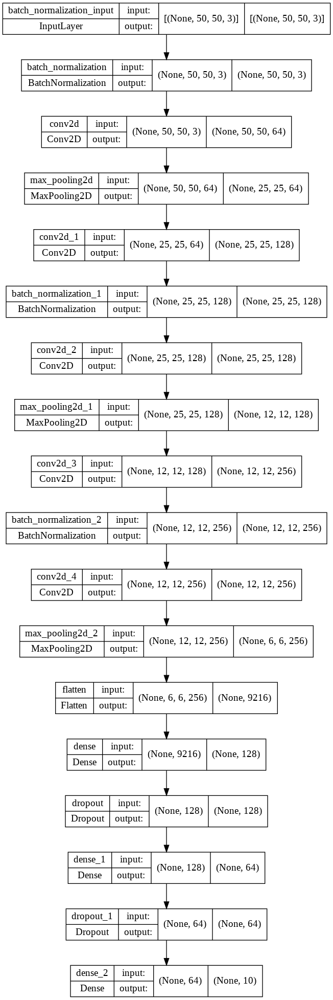

In [62]:
keras.utils.plot_model(model, show_shapes=True)

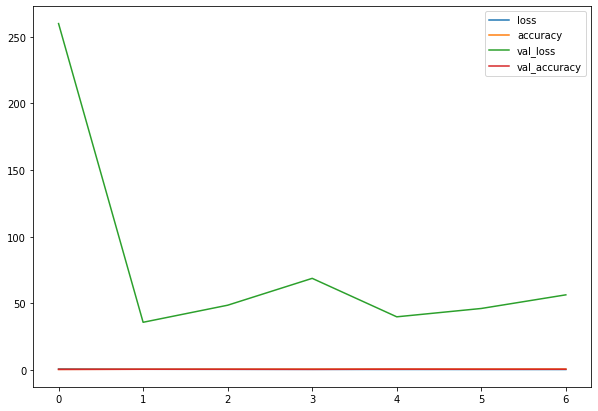

In [63]:
pd.DataFrame(history5.history).plot(figsize=(10,7))

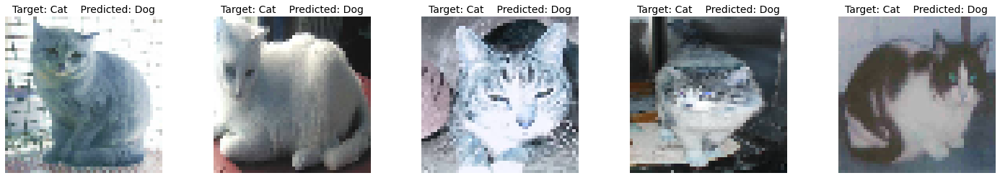

In [64]:
#Ploting several of the misclassified images from the model


classes = ['Dog', 'Cat']

predictions = np.argmax(model.predict(X_test), axis=-1)
misclassifiedIndexes = []
index = 0
for target, predict in zip(y_test, predictions):
  if target != predict:
    misclassifiedIndexes.append(index)
  index += 1

misclassifiedIndexes

plt.figure(figsize=(25,4))
for index in range(5):
  plt.subplot(1,5,index+1)
  plt.imshow(X_test[misclassifiedIndexes[index]]/255, cmap='binary')
  plt.axis('off')
  plt.title(f'Target: {classes[y_test[misclassifiedIndexes[index]]]}    Predicted: {classes[predictions[misclassifiedIndexes[index]]]}', fontsize=14)

In [65]:
model.save('DiffSplit_BN_model')

INFO:tensorflow:Assets written to: DiffSplit_BN_model/assets


In [66]:
model.save_weights('DiffSplit_BN_model_weight')

In [67]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

#  Accuracy for the validation set and for the test set for best fit model are 0.846800029277801 and 0.8356000185012817 respectively.

#Part 3
Use transfer learning. Train on at least three different expert CNNs: Xception, a variant of ResNet, and a variant of EfficientNet. See here for a full list of models available in Keras. Please note that many of these have special requirements (for image size etc). You decide (or experiment with) how to best transfer learn on these expert CNNs.

What is the accuracy of your best model (on both validation and testing sets)? Plot several misclassified images. Save your accuracy and val_accuracy per epoch (from your best model). You will plot them in Part 4.



# Resnet50

In [19]:
#Getting Validation set
from sklearn.model_selection import train_test_split

from sklearn.model_selection import train_test_split
X_train_full, X_train_v, y_train_full, y_train_v = train_test_split(X,
                                                                y,
                                                                test_size=5000)
#Splitting training dataset into ultimate training and testing set
X_train_tr, X_test, y_train_tr, y_test= train_test_split(X_train_full,
                                                                y_train_full,
                                                                test_size=5000)

In [20]:
# preprocessing input
tf.keras.applications.resnet.preprocess_input(X_train_tr)
tf.keras.applications.resnet.preprocess_input(X_train_v)


array([[[[ -57.939,  -71.779,  -72.68 ],
         [ -54.939,  -68.779,  -69.68 ],
         [ -50.939,  -64.779,  -64.68 ],
         ...,
         [   6.061,   -9.779,   -0.68 ],
         [   8.061,   -7.779,    4.32 ],
         [   4.061,  -10.779,   -5.68 ]],

        [[ -52.939,  -65.779,  -72.68 ],
         [ -52.939,  -65.779,  -73.68 ],
         [ -51.939,  -66.779,  -62.68 ],
         ...,
         [   8.061,   -6.779,   -1.68 ],
         [   8.061,   -6.779,   -0.68 ],
         [   8.061,   -5.779,   -6.68 ]],

        [[ -56.939,  -69.779,  -76.68 ],
         [ -55.939,  -68.779,  -75.68 ],
         [ -52.939,  -65.779,  -72.68 ],
         ...,
         [   8.061,   -7.779,   -0.68 ],
         [   7.061,   -6.779,   -5.68 ],
         [   5.061,   -8.779,   -6.68 ]],

        ...,

        [[ -85.939,  -99.779, -104.68 ],
         [ -89.939, -109.779, -118.68 ],
         [ -86.939, -111.779, -116.68 ],
         ...,
         [ -18.939,  -48.779,  -62.68 ],
         [ -18.939,  -

In [21]:
# Transfer learning
base_model = keras.applications.ResNet50(weights="imagenet",
                                         include_top=False,
                                         input_shape=(50,50,3))
global_avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
dropout = keras.layers.Dropout(0.05)(global_avg)
output = keras.layers.Dense(10, activation="softmax")(dropout)
model = keras.models.Model(inputs=base_model.input, outputs=output)

94781440/94765736 [==============================] - 2s 0us/step


In [22]:
# Freezing
for layer in base_model.layers:
  layer.trainable = False

model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.Nadam(1e-3),
              metrics=["accuracy"])

history = model.fit(X_train_tr, y_train_tr, batch_size=32,
                    epochs=50, validation_data=(X_train_v, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/50
469/469 [==============================] - 37s 54ms/step - loss: 0.7622 - accuracy: 0.7542 - val_loss: 0.5517 - val_accuracy: 0.8034
Epoch 2/50
469/469 [==============================] - 23s 49ms/step - loss: 0.5469 - accuracy: 0.7985 - val_loss: 0.5165 - val_accuracy: 0.7978
Epoch 3/50
469/469 [==============================] - 23s 48ms/step - loss: 0.5022 - accuracy: 0.8065 - val_loss: 0.5252 - val_accuracy: 0.8062
Epoch 4/50
469/469 [==============================] - 22s 48ms/step - loss: 0.4826 - accuracy: 0.8118 - val_loss: 0.6121 - val_accuracy: 0.7808
Epoch 5/50
469/469 [==============================] - 22s 48ms/step - loss: 0.4685 - accuracy: 0.8176 - val_loss: 0.4906 - val_accuracy: 0.8100
Epoch 6/50
469/469 [==============================] - 23s 48ms/step - loss: 0.4607 - accuracy: 0.8234 - val_loss: 0.6641 - val_accuracy: 0.7682
Epoch 7/50
469/469 [==============================] - 23s 48ms/step - loss: 0.4605 - accuracy: 0.8225 - val_loss: 0.5403 - val_accuracy:

In [23]:
# Unfreezing the transferred layers and training the model
%%time
for layer in base_model.layers:
  layer.trainable = True

model.compile(loss="sparse_categorical_crossentropy",
              optimizer=keras.optimizers.Nadam(1e-4),
              metrics=["accuracy"])

history = model.fit(X_train_tr, y_train_tr, batch_size=32,
                    epochs=100, validation_data=(X_train_v, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])


Epoch 1/100
469/469 [==============================] - 139s 247ms/step - loss: 0.4718 - accuracy: 0.8016 - val_loss: 0.3640 - val_accuracy: 0.8620
Epoch 2/100
469/469 [==============================] - 114s 243ms/step - loss: 0.1794 - accuracy: 0.9289 - val_loss: 0.4503 - val_accuracy: 0.8388
Epoch 3/100
469/469 [==============================] - 114s 243ms/step - loss: 0.0797 - accuracy: 0.9719 - val_loss: 0.3841 - val_accuracy: 0.8684
Epoch 4/100
469/469 [==============================] - 119s 254ms/step - loss: 0.0596 - accuracy: 0.9783 - val_loss: 0.4091 - val_accuracy: 0.8714
Epoch 5/100
469/469 [==============================] - 114s 243ms/step - loss: 0.0599 - accuracy: 0.9801 - val_loss: 0.4597 - val_accuracy: 0.8660
Epoch 6/100
469/469 [==============================] - 114s 243ms/step - loss: 0.0570 - accuracy: 0.9787 - val_loss: 0.4048 - val_accuracy: 0.8798
CPU times: user 7min 40s, sys: 2min 57s, total: 10min 37s
Wall time: 11min 54s


In [24]:
model.evaluate(X_test, y_test)

157/157 [==============================] - 6s 37ms/step - loss: 0.6077 - accuracy: 0.8022


[0.6076751947402954, 0.8022000193595886]

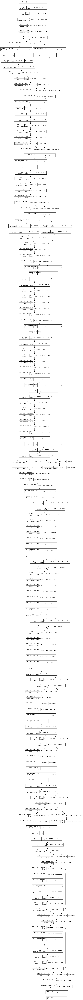

In [25]:
keras.utils.plot_model(model, show_shapes=True)

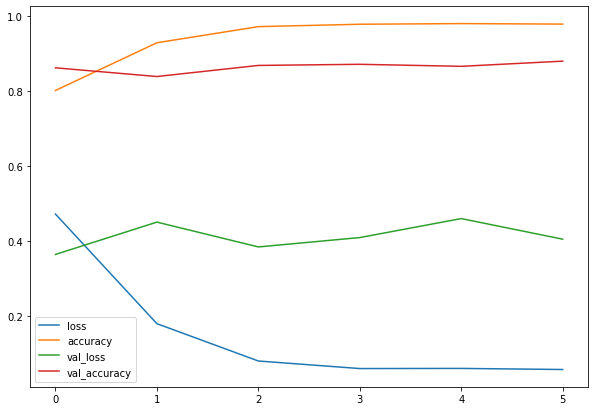

In [26]:
pd.DataFrame(history.history).plot(figsize=(10,7))

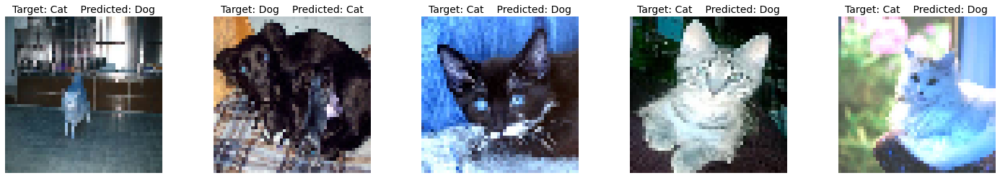

In [27]:
#Ploting several of the misclassified images from the model


classes = ['Dog', 'Cat']

predictions = np.argmax(model.predict(X_test), axis=-1)
misclassifiedIndexes = []
index = 0
for target, predict in zip(y_test, predictions):
  if target != predict:
    misclassifiedIndexes.append(index)
  index += 1

misclassifiedIndexes

plt.figure(figsize=(25,4))
for index in range(5):
  plt.subplot(1,5,index+1)
  plt.imshow(X_test[misclassifiedIndexes[index]]/255, cmap='binary')
  plt.axis('off')
  plt.title(f'Target: {classes[y_test[misclassifiedIndexes[index]]]}    Predicted: {classes[predictions[misclassifiedIndexes[index]]]}', fontsize=14)

In [28]:
model.save('Resnet50')

INFO:tensorflow:Assets written to: Resnet50/assets


In [29]:
model.save_weights('Resnet50_weights')

In [30]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

#Transfer learning with Xception

In [31]:
#Getting Validation set
from sklearn.model_selection import train_test_split

from sklearn.model_selection import train_test_split
X_train_full, X_train_v, y_train_full, y_train_v = train_test_split(X,
                                                                y,
                                                                test_size=5000)
#Splitting training dataset into ultimate training and testing set
X_train_tr, X_test, y_train_tr, y_test= train_test_split(X_train_full,
                                                                y_train_full,
                                                                test_size=5000)

In [32]:
tf.keras.applications.xception.preprocess_input(X_train_tr)
tf.keras.applications.xception.preprocess_input(X_train_v)

array([[[[-0.7254902 , -0.74117647,  0.11372549],
         [-0.59215686, -0.44313725, -0.40392157],
         [-0.70980392, -0.70980392,  0.01176471],
         ...,
         [-0.7254902 , -0.57647059, -0.31764706],
         [-0.59215686, -0.41176471, -0.02745098],
         [-0.69411765, -0.61568627, -0.16862745]],

        [[-0.55294118, -0.45098039, -0.41176471],
         [-0.64705882, -0.69411765, -0.15294118],
         [-0.79607843, -0.75686275,  0.0745098 ],
         ...,
         [-0.56078431, -0.51372549, -0.17647059],
         [-0.63921569, -0.6       , -0.16078431],
         [-0.60784314, -0.49019608, -0.29411765]],

        [[-0.67843137, -0.76470588,  0.0745098 ],
         [-0.55294118, -0.48235294, -0.31764706],
         [-0.60784314, -0.64705882, -0.11372549],
         ...,
         [-0.63921569, -0.52941176, -0.34901961],
         [-0.54509804, -0.45882353, -0.36470588],
         [-0.79607843, -0.78039216, -0.16078431]],

        ...,

        [[-0.81960784, -0.94509804,  0

In [33]:
# Preprocessing resize
X_train_X = tf.image.resize(X_train_tr, [71,71])
X_valid_X = tf.image.resize(X_train_v, [71,71])

In [34]:

base_model = keras.applications.Xception(weights="imagenet", 
                                              include_top=False,
                                         input_shape=(71,71,3))
global_avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
dropout = keras.layers.Dropout(0.05)(global_avg) 
output = keras.layers.Dense(10, activation="softmax")(dropout)
model = keras.models.Model(inputs=base_model.input, outputs=output)

83697664/83683744 [==============================] - 1s 0us/step


In [35]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(rotation_range=20, horizontal_flip=True)

In [36]:
for layer in base_model.layers:
    layer.trainable = False

model.compile(loss="sparse_categorical_crossentropy",
                optimizer=keras.optimizers.Nadam(1e-3),
                metrics=["accuracy"])

history = model.fit(datagen.flow(X_train_X, y_train_tr, batch_size=32), 
                    epochs=50, validation_data=(X_valid_X, y_train_v), 
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/50
469/469 [==============================] - 44s 84ms/step - loss: 0.5297 - accuracy: 0.7441 - val_loss: 0.4685 - val_accuracy: 0.7808
Epoch 2/50
469/469 [==============================] - 37s 79ms/step - loss: 0.4607 - accuracy: 0.7857 - val_loss: 0.4190 - val_accuracy: 0.8092
Epoch 3/50
469/469 [==============================] - 40s 85ms/step - loss: 0.4399 - accuracy: 0.7966 - val_loss: 0.4212 - val_accuracy: 0.8084
Epoch 4/50
469/469 [==============================] - 41s 86ms/step - loss: 0.4388 - accuracy: 0.7967 - val_loss: 0.4170 - val_accuracy: 0.8116
Epoch 5/50
469/469 [==============================] - 46s 98ms/step - loss: 0.4383 - accuracy: 0.7949 - val_loss: 0.4155 - val_accuracy: 0.8048
Epoch 6/50
469/469 [==============================] - 37s 80ms/step - loss: 0.4338 - accuracy: 0.8004 - val_loss: 0.4275 - val_accuracy: 0.7986
Epoch 7/50
469/469 [==============================] - 37s 78ms/step - loss: 0.4274 - accuracy: 0.8047 - val_loss: 0.4084 - val_accuracy:

In [37]:
# Unfreeze and train
for layer in base_model.layers:
    layer.trainable = True

model.compile(loss="sparse_categorical_crossentropy",
                optimizer=keras.optimizers.Nadam(1e-4), 
                metrics=["accuracy"])

n_epochs = 100
batch_size = 32
history = model.fit(datagen.flow(X_train_X, y_train_tr, batch_size=batch_size),
                    epochs=n_epochs,
                    validation_data=(X_valid_X, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/100
469/469 [==============================] - 133s 248ms/step - loss: 0.3742 - accuracy: 0.8338 - val_loss: 0.3049 - val_accuracy: 0.8826
Epoch 2/100
469/469 [==============================] - 119s 253ms/step - loss: 0.2300 - accuracy: 0.9052 - val_loss: 0.2360 - val_accuracy: 0.9058
Epoch 3/100
469/469 [==============================] - 115s 245ms/step - loss: 0.1689 - accuracy: 0.9319 - val_loss: 0.2911 - val_accuracy: 0.8944
Epoch 4/100
469/469 [==============================] - 115s 246ms/step - loss: 0.1307 - accuracy: 0.9499 - val_loss: 0.2510 - val_accuracy: 0.9218
Epoch 5/100
469/469 [==============================] - 115s 245ms/step - loss: 0.1042 - accuracy: 0.9599 - val_loss: 0.2490 - val_accuracy: 0.9184
Epoch 6/100
469/469 [==============================] - 119s 254ms/step - loss: 0.0816 - accuracy: 0.9689 - val_loss: 0.2881 - val_accuracy: 0.9042
Epoch 7/100
469/469 [==============================] - 115s 245ms/step - loss: 0.0583 - accuracy: 0.9787 - val_loss: 0

In [38]:
X_test = tf.image.resize(X_test, [71,71])

In [39]:
model.evaluate(X_test, y_test)

157/157 [==============================] - 7s 45ms/step - loss: 531.2206 - accuracy: 0.4956


[531.2206420898438, 0.49559998512268066]

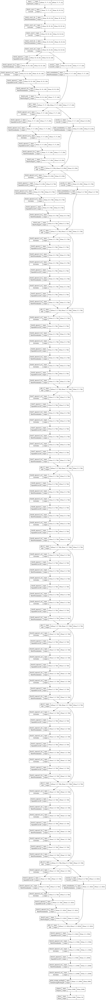

In [40]:
keras.utils.plot_model(model, show_shapes=True)

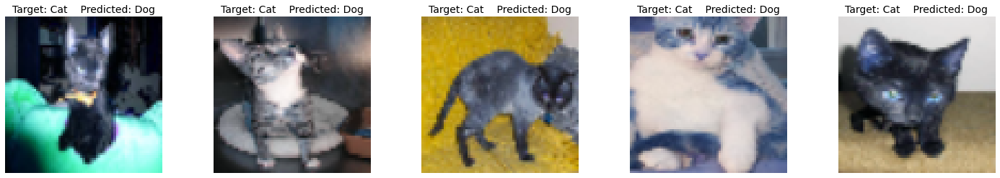

In [41]:
#Ploting several of the misclassified images from the model


classes = ['Dog', 'Cat']

predictions = np.argmax(model.predict(X_test), axis=-1)
misclassifiedIndexes = []
index = 0
for target, predict in zip(y_test, predictions):
  if target != predict:
    misclassifiedIndexes.append(index)
  index += 1

misclassifiedIndexes

plt.figure(figsize=(25,4))
for index in range(5):
  plt.subplot(1,5,index+1)
  plt.imshow(X_test[misclassifiedIndexes[index]]/255, cmap="binary")
  plt.axis('off')
  plt.title(f'Target: {classes[y_test[misclassifiedIndexes[index]]]}    Predicted: {classes[predictions[misclassifiedIndexes[index]]]}', fontsize=14)

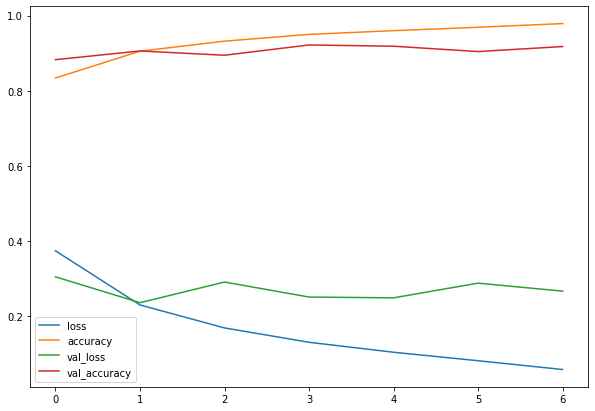

In [42]:
pd.DataFrame(history.history).plot(figsize=(10,7))

In [43]:
model.save('Xception')
model.save_weights('Xception_weights')

INFO:tensorflow:Assets written to: Xception/assets


# EfficientNetB0

In [15]:
#Getting Validation set
from sklearn.model_selection import train_test_split

from sklearn.model_selection import train_test_split
X_train_full, X_train_v, y_train_full, y_train_v = train_test_split(X,
                                                                y,
                                                                test_size=5000)
#Splitting training dataset into ultimate training and testing set
X_train_tr, X_test, y_train_tr, y_test= train_test_split(X_train_full,
                                                                y_train_full,
                                                                test_size=5000)

In [16]:

X_train_X = tf.image.resize(X_train_tr[:2500], [150,150])
X_valid_X = tf.image.resize(X_train_v, [150,150])


In [46]:
base_model = keras.applications.EfficientNetB0(weights="imagenet", 
                                              include_top=False,
                                             input_shape=(150,150,3))
global_avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
dropout = keras.layers.Dropout(0.05)(global_avg) 
output = keras.layers.Dense(10, activation="softmax")(dropout)
model = keras.models.Model(inputs=base_model.input, outputs=output)

16719872/16705208 [==============================] - 0s 0us/step


In [17]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(rotation_range=20, horizontal_flip=True)

In [48]:
for layer in base_model.layers:
    layer.trainable = False

model.compile(loss="sparse_categorical_crossentropy",
                optimizer=keras.optimizers.Nadam(1e-3),
                metrics=["accuracy"])

history = model.fit(datagen.flow(X_train_X, y_train_tr[:2500], batch_size=32), 
                    epochs=50, validation_data=(X_valid_X, y_train_v), 
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/50
79/79 [==============================] - 38s 379ms/step - loss: 0.6794 - accuracy: 0.7572 - val_loss: 0.3057 - val_accuracy: 0.8782
Epoch 2/50
79/79 [==============================] - 31s 387ms/step - loss: 0.3049 - accuracy: 0.8768 - val_loss: 0.2591 - val_accuracy: 0.8916
Epoch 3/50
79/79 [==============================] - 26s 334ms/step - loss: 0.2562 - accuracy: 0.8900 - val_loss: 0.2300 - val_accuracy: 0.9072
Epoch 4/50
79/79 [==============================] - 26s 336ms/step - loss: 0.2421 - accuracy: 0.8972 - val_loss: 0.2337 - val_accuracy: 0.8970
Epoch 5/50
79/79 [==============================] - 26s 333ms/step - loss: 0.2416 - accuracy: 0.8948 - val_loss: 0.2157 - val_accuracy: 0.9096
Epoch 6/50
79/79 [==============================] - 26s 326ms/step - loss: 0.2293 - accuracy: 0.9072 - val_loss: 0.2168 - val_accuracy: 0.9058
Epoch 7/50
79/79 [==============================] - 26s 332ms/step - loss: 0.2159 - accuracy: 0.9136 - val_loss: 0.2073 - val_accuracy: 0.9128

In [49]:
for layer in base_model.layers:
    layer.trainable = True

model.compile(loss="sparse_categorical_crossentropy",
                optimizer=keras.optimizers.Nadam(1e-4), # need smaller lr
                metrics=["accuracy"])

n_epochs = 100
batch_size = 32
history = model.fit(datagen.flow(X_train_X, y_train_tr[:2500], batch_size=batch_size),
                    epochs=n_epochs,
                    validation_data=(X_valid_X, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/100
79/79 [==============================] - 68s 509ms/step - loss: 0.5515 - accuracy: 0.8476 - val_loss: 0.2237 - val_accuracy: 0.9136
Epoch 2/100
79/79 [==============================] - 47s 599ms/step - loss: 0.2426 - accuracy: 0.9128 - val_loss: 0.2476 - val_accuracy: 0.9040
Epoch 3/100
79/79 [==============================] - 38s 473ms/step - loss: 0.1547 - accuracy: 0.9472 - val_loss: 0.2222 - val_accuracy: 0.9160
Epoch 4/100
79/79 [==============================] - 37s 472ms/step - loss: 0.1133 - accuracy: 0.9628 - val_loss: 0.1943 - val_accuracy: 0.9266
Epoch 5/100
79/79 [==============================] - 37s 474ms/step - loss: 0.0865 - accuracy: 0.9712 - val_loss: 0.1935 - val_accuracy: 0.9254
Epoch 6/100
79/79 [==============================] - 38s 475ms/step - loss: 0.0738 - accuracy: 0.9740 - val_loss: 0.1708 - val_accuracy: 0.9366
Epoch 7/100
79/79 [==============================] - 38s 476ms/step - loss: 0.0727 - accuracy: 0.9704 - val_loss: 0.1700 - val_accuracy:

In [35]:
X_test_X = tf.image.resize(X_test, [150,150])

In [51]:
model.evaluate(X_test, y_test)

157/157 [==============================] - 12s 76ms/step - loss: 0.2071 - accuracy: 0.9342


[0.20711347460746765, 0.9341999888420105]

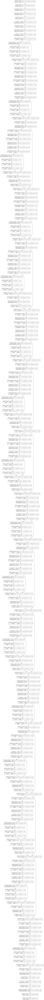

In [52]:
keras.utils.plot_model(model, show_shapes=True)

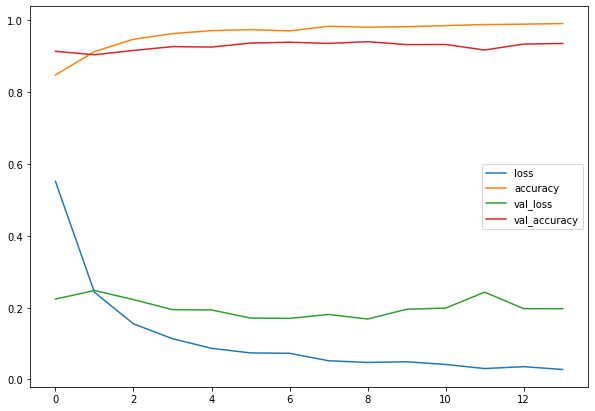

In [53]:
pd.DataFrame(history.history).plot(figsize=(10,7))

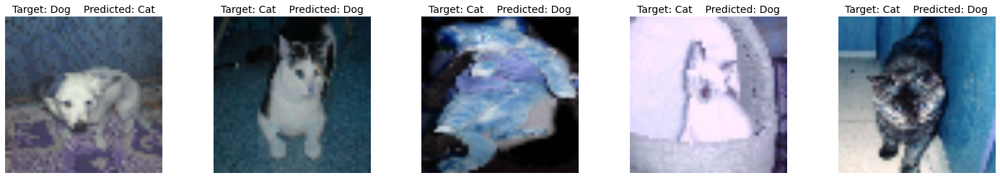

In [54]:
#Ploting several of the misclassified images from the model


classes = ['Dog', 'Cat']

predictions = np.argmax(model.predict(X_test), axis=-1)
misclassifiedIndexes = []
index = 0
for target, predict in zip(y_test, predictions):
  if target != predict:
    misclassifiedIndexes.append(index)
  index += 1

misclassifiedIndexes

plt.figure(figsize=(25,4))
for index in range(5):
  plt.subplot(1,5,index+1)
  plt.imshow(X_test[misclassifiedIndexes[index]]/255, cmap="binary")
  plt.axis('off')
  plt.title(f'Target: {classes[y_test[misclassifiedIndexes[index]]]}    Predicted: {classes[predictions[misclassifiedIndexes[index]]]}', fontsize=14)

In [55]:
model.save('EfficientNetB0')
model.save_weights('EfficientNetB0_weights')

INFO:tensorflow:Assets written to: EfficientNetB0/assets


In [56]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

In [59]:

print('The maximun validation accuracy is' , max(history.history['val_accuracy']) )

The maximun validation accuracy is 0.9404000043869019


#The validation and test accuracy for best fit model in transfer learning are 0.9404000043869019 and 0.9341999888420105 respectively.

**Part 4**</br>
Plot the training and validation accuracy per epoch for your (best) model from each part. Discuss any differences. Which model(s) tend to be overfit? Which model(s) are not? Why?

Note: If you have a model B that is only a little better than a model A with respect to validation/testing accuracy, but model B is not overfit and model A is, that is actually a huge improvement. 

# For part 1

In [69]:
Part1_model = tf.keras.models.load_model('/content/simple_CNN')

history_part1 = Part1_model.fit(X_train_tr, y_train_tr, epochs=100, batch_size=32,
                    validation_data=(X_train_v, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/100
719/719 [==============================] - 28s 36ms/step - loss: 0.7921 - accuracy: 0.4917 - val_loss: 0.6926 - val_accuracy: 0.5200
Epoch 2/100
719/719 [==============================] - 27s 37ms/step - loss: 4.2214 - accuracy: 0.4994 - val_loss: 0.7121 - val_accuracy: 0.5200
Epoch 3/100
719/719 [==============================] - 26s 36ms/step - loss: 0.8113 - accuracy: 0.5004 - val_loss: 0.6947 - val_accuracy: 0.4800
Epoch 4/100
719/719 [==============================] - 26s 37ms/step - loss: 0.6960 - accuracy: 0.4980 - val_loss: 0.6928 - val_accuracy: 0.5200
Epoch 5/100
719/719 [==============================] - 26s 36ms/step - loss: 0.6958 - accuracy: 0.4991 - val_loss: 0.6939 - val_accuracy: 0.4800
Epoch 6/100
719/719 [==============================] - 26s 36ms/step - loss: 0.6946 - accuracy: 0.5043 - val_loss: 0.6943 - val_accuracy: 0.4800


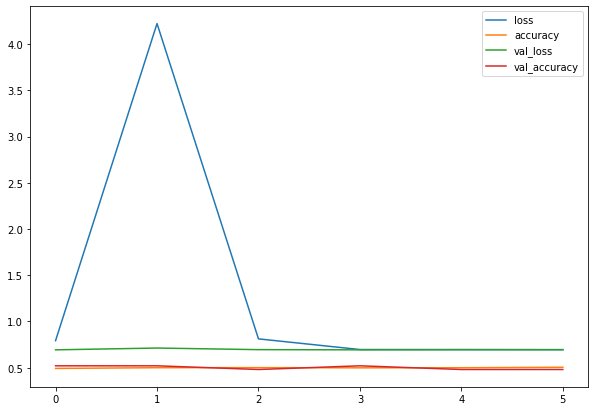

In [71]:
pd.DataFrame(history_part1.history).plot(figsize=(10,7))

# For part 2(best model)

In [18]:
Part2_model = tf.keras.models.load_model('/content/With_batchNormalization')
history3 =Part2_model.fit(X_train_tr, y_train_tr, batch_size=32,
                    epochs=100,
                    validation_data=(X_train_v, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/100
469/469 [==============================] - 35s 51ms/step - loss: 0.2740 - accuracy: 0.8902 - val_loss: 0.3152 - val_accuracy: 0.8694
Epoch 2/100
469/469 [==============================] - 22s 48ms/step - loss: 0.2403 - accuracy: 0.9021 - val_loss: 0.3162 - val_accuracy: 0.8620
Epoch 3/100
469/469 [==============================] - 22s 47ms/step - loss: 0.1952 - accuracy: 0.9191 - val_loss: 0.2847 - val_accuracy: 0.8714
Epoch 4/100
469/469 [==============================] - 22s 47ms/step - loss: 0.1685 - accuracy: 0.9303 - val_loss: 0.2724 - val_accuracy: 0.8860
Epoch 5/100
469/469 [==============================] - 22s 48ms/step - loss: 0.1494 - accuracy: 0.9392 - val_loss: 0.3356 - val_accuracy: 0.8746
Epoch 6/100
469/469 [==============================] - 22s 48ms/step - loss: 0.1254 - accuracy: 0.9485 - val_loss: 0.3287 - val_accuracy: 0.8844
Epoch 7/100
469/469 [==============================] - 22s 48ms/step - loss: 0.1222 - accuracy: 0.9498 - val_loss: 0.3416 - val_ac

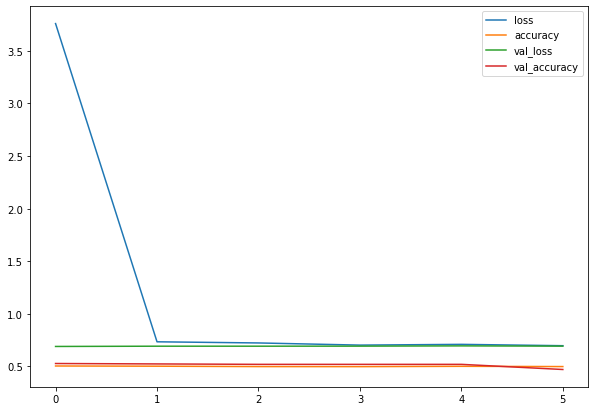

In [79]:
pd.DataFrame(history3.history).plot(figsize=(10,7))

# Part 3 best model 

In [18]:
Part3_model = tf.keras.models.load_model('/content/EfficientNetB0')
history_f = Part3_model.fit(datagen.flow(X_train_X, y_train_tr[:2500], batch_size=32),
                    epochs=100,
                    validation_data=(X_valid_X, y_train_v),
                    callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Epoch 1/100
79/79 [==============================] - 87s 654ms/step - loss: 0.1853 - accuracy: 0.9360 - val_loss: 0.1392 - val_accuracy: 0.9506
Epoch 2/100
79/79 [==============================] - 38s 477ms/step - loss: 0.1337 - accuracy: 0.9472 - val_loss: 0.1332 - val_accuracy: 0.9506
Epoch 3/100
79/79 [==============================] - 47s 598ms/step - loss: 0.0870 - accuracy: 0.9680 - val_loss: 0.1438 - val_accuracy: 0.9448
Epoch 4/100
79/79 [==============================] - 47s 599ms/step - loss: 0.0725 - accuracy: 0.9740 - val_loss: 0.1244 - val_accuracy: 0.9528
Epoch 5/100
79/79 [==============================] - 47s 599ms/step - loss: 0.0495 - accuracy: 0.9812 - val_loss: 0.1498 - val_accuracy: 0.9480
Epoch 6/100
79/79 [==============================] - 38s 474ms/step - loss: 0.0485 - accuracy: 0.9824 - val_loss: 0.1265 - val_accuracy: 0.9544
Epoch 7/100
79/79 [==============================] - 38s 475ms/step - loss: 0.0431 - accuracy: 0.9820 - val_loss: 0.1230 - val_accuracy:

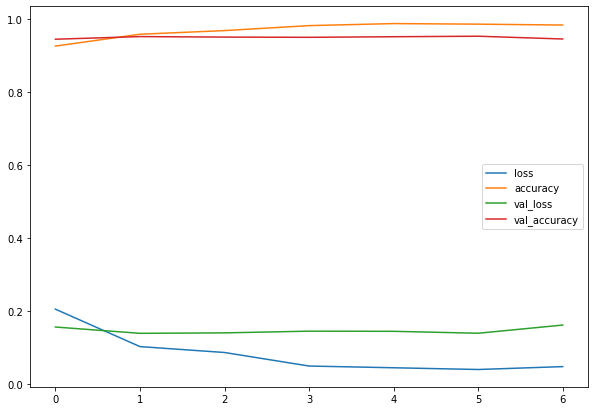

In [27]:
pd.DataFrame(history_f.history).plot(figsize=(10,7))

Since we selected the best model from each part, there are no issue of overfitting involved. The best accuracy was yeilded from transfer learning model  with Efficinet B0. The least accuracy was found on simple convolutional neural network with no data augmentation fed. The highest validation score was obtained Efficientnet B0 which was 94% and fairly fit with test accuracy score of 93.4%.

As convolutional neural network was specialized in image processing,and with data augementation and transfer learning, I do not see any overfit to be reported. I observed the Xception transfer learning model to be overfit though.  

**GRADUATE STUDENTS ONLY**</br>
Again, test your best model on the Kaggle testing set and submit. Show a screenshot etc as proof.

In [19]:
!unzip test.zip

Streaming output truncated to the last 5000 lines.
  inflating: test/5499.jpg           
  inflating: test/55.jpg             
  inflating: test/550.jpg            
  inflating: test/5500.jpg           
  inflating: test/5501.jpg           
  inflating: test/5502.jpg           
  inflating: test/5503.jpg           
  inflating: test/5504.jpg           
  inflating: test/5505.jpg           
  inflating: test/5506.jpg           
  inflating: test/5507.jpg           
  inflating: test/5508.jpg           
  inflating: test/5509.jpg           
  inflating: test/551.jpg            
  inflating: test/5510.jpg           
  inflating: test/5511.jpg           
  inflating: test/5512.jpg           
  inflating: test/5513.jpg           
  inflating: test/5514.jpg           
  inflating: test/5515.jpg           
  inflating: test/5516.jpg           
  inflating: test/5517.jpg           
  inflating: test/5518.jpg           
  inflating: test/5519.jpg           
  inflating: test/552.jpg            

In [71]:
!test/

/bin/bash: test/: Is a directory


In [21]:
#load it into one dataframe and create your y labels
import os
import pandas as pd

filenames = os.listdir("/content/test")
categories = []
for filename in filenames:
    category = filename.split('.')[0]
    if category == 'cat':
        categories.append(1)
    else:
        categories.append(0)

df = pd.DataFrame({
    'filename': filenames,
    'category': categories
})
# code provided by Dr. Leslie Kerby

In [23]:
import cv2
import numpy as np

def resize_img(file_path):
  img = cv2.imread(file_path, cv2.IMREAD_COLOR)
  return cv2.resize(img, (50,50)) 
X = np.ndarray((12500,50,50,3))  
for i,image_file in enumerate(df['filename']):
    X[i,:] = resize_img('test/'+image_file)

In [64]:
X=np.array(X)

In [77]:
X.shape

(12500, 50, 50, 3)

In [78]:
prediction = Part2_model.predict(X)

In [79]:
type(prediction)

numpy.ndarray

In [90]:
predictions=[]
for i in range(12500):
  predictions.append(np.argmax(prediction[i]))


In [91]:
predictions

[1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,


In [92]:
len(predictions)

12500

In [93]:
submissions = pd.DataFrame({"id": list(range(1,len(predictions)+1)),
    "Label": predictions})
submissions.to_csv("my_submission.csv", index=False, header=True)
#https://stackoverflow.com/questions/54167910/keras-how-to-use-argmax-for-predictions
#https://colab.research.google.com/drive/17MsV4f8Bap8y2MU8BcKBNXRdTNE2ftP3#scrollTo=hNLSLschbtd8

In [94]:
!kaggle competitions submit dogs-vs-cats-redux-kernels-edition -f my_submission.csv -m "Mid_term_Project_CS4499"

100% 86.8k/86.8k [00:04<00:00, 19.7kB/s]
Successfully submitted to Dogs vs. Cats Redux: Kernels Edition

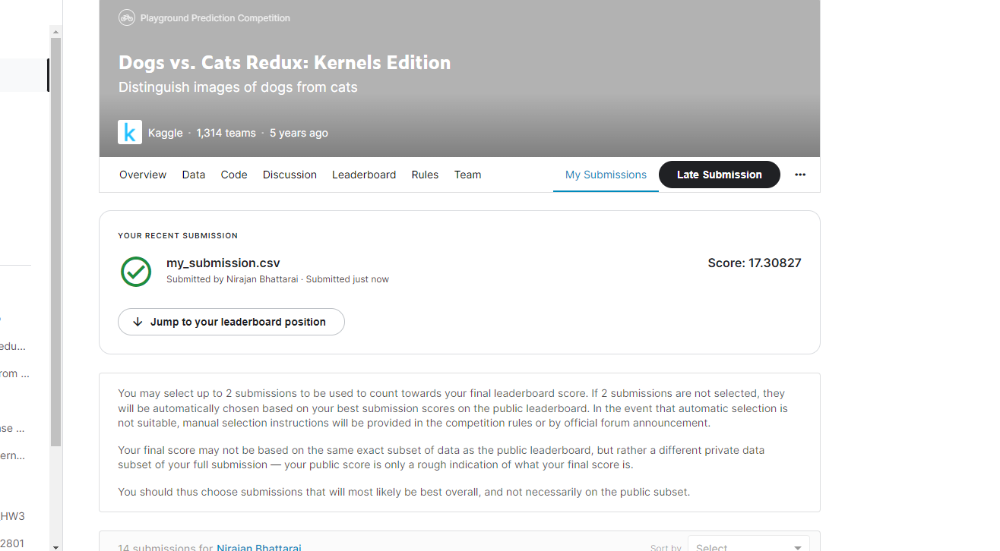